In [1]:
import networkx as nx, matplotlib.cm as cm, pandas as pd, numpy as np
import geopandas as gpd
from shapely.geometry import Point, mapping
%matplotlib inline

import warnings
warnings.simplefilter(action="ignore")

pd.set_option('precision', 5)
pd.options.display.float_format = '{:20.2f}'.format
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.mode.chained_assignment = None

from networkx.algorithms import community as nxcomm
import community
import cityImage as ci
import regions as ur

In [ ]:
## Crs and names

In [ ]:
place = 'Boston, MA'
epsg = 26986
city_name = 'Boston'
crs = 'EPSG'+str(crs)

### Downloading

Choose between the following methods:
* *OSMplace*, provide an OSM place name (e.g. City).
* *OSMpolygon*, provide an OSM polygon (relation) name.
* *distance_from_address*, provide a precise address and define parameter "distance" (which is otherwise not necessary)

In [2]:
download_method = 'OSMplace'
distance = None
nodes_graph, edges_graph = ci.get_network_fromOSM(place, download_method, 'drive', epsg, distance = distance)

In [3]:
"""
- "same_uv_edges" regulates the handling of edges with same pair of u-v nodes but different geometries.
When true keeps a center line between the two segments, unless one of the two segments is significantly longer than 
the other (>30%). In this case, the longer segment is deleted.
"""
nodes_graph, edges_graph = ci.clean_network(nodes_graph, edges_graph, dead_ends = True, remove_disconnected_islands = True,
                            self_loops = True, same_uv_edges = True)

In [14]:
# saving
input_path = 'Input/'+city_name
nodes_graph.to_file(input_path+'_nodes.shp')
edges_graph.to_file(input_path+'_edges.shp')

### Alternatively, load from local path

In [2]:
epsg = 26986
city_name = 'Boston'
crs = {'init': 'epsg:26986', 'no_defs': True}

input_path = 'Input/'+city_name
nodes_graph = gpd.read_file(input_path+'_nodes.shp')
edges_graph = gpd.read_file(input_path+'_edges.shp')


nodes_graph, edges_graph = nodes_graph.to_crs(epsg=epsg), edges_graph.to_crs(epsg=epsg)
nodes_graph.index,edges_graph.index  = nodes_graph.nodeID, edges_graph.edgeID
nodes_graph.index.name, edges_graph.index.name  = None, None

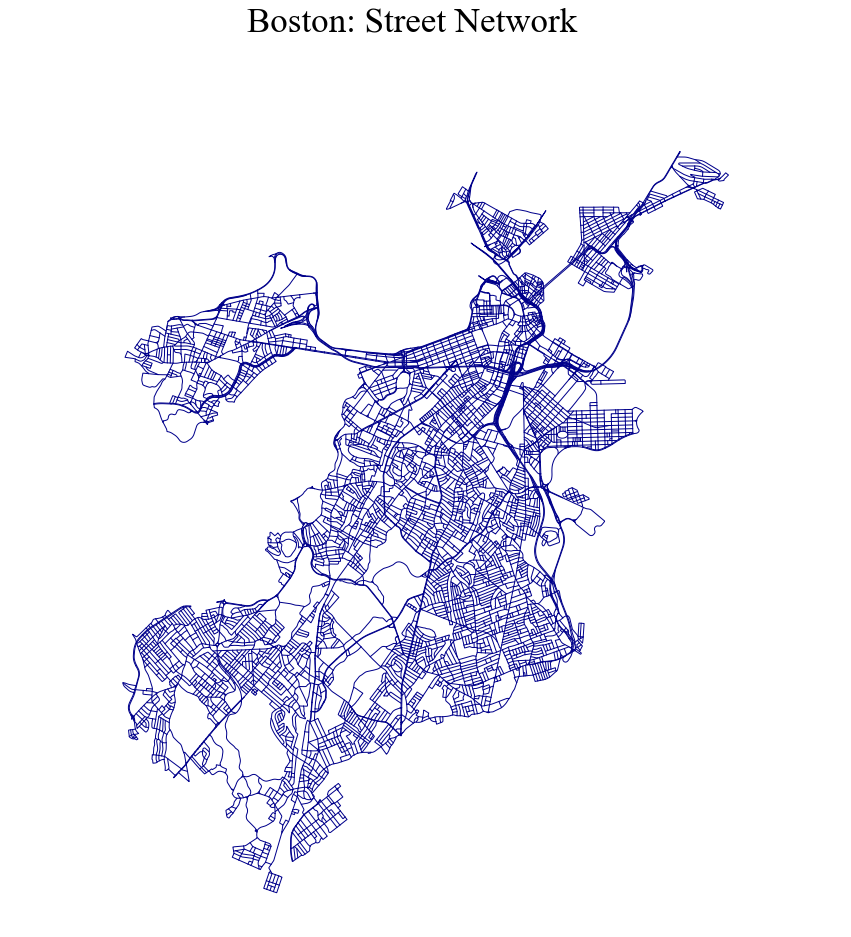

In [3]:
ci.plot_gdf(edges_graph, scheme = None, black_background = False, fig_size = 15, 
            title = city_name+': Street Network', color = 'darkblue')

# 1. Barriers identification

Choose between the following methods:
* *OSMplace*, provide an OSM place name (e.g. City).
* *distance_from_address*, provide a precise address and define parameter "distance" (which is otherwise not necessary)
* *Polygon*

In [4]:
# define method and create envelope with wgs coordinate system
download_method = 'polygon'
place = ci.envelope_wgs(edges_graph)
distance = None

In [5]:
barriers = ci.get_barriers(place, download_method = 'polygon', distance = None, epsg = epsg)

c:\users\g_filo01\miniconda3\envs\cityimage\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
c:\users\g_filo01\miniconda3\envs\cityimage\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


### Visualisation

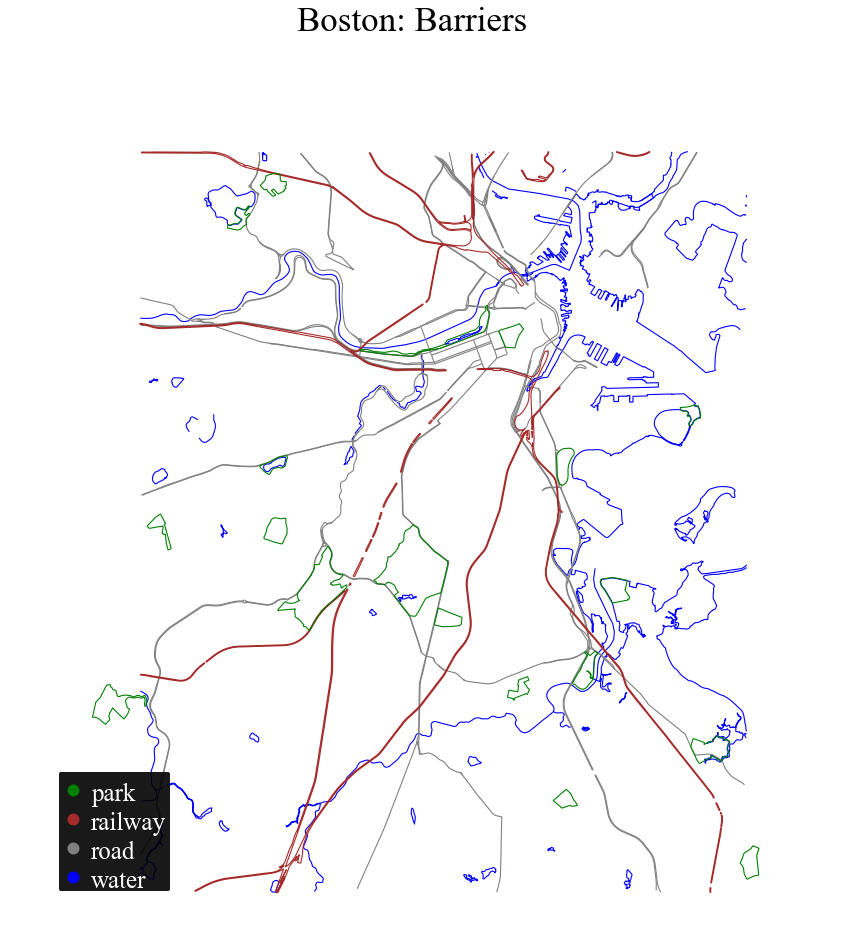

In [10]:
ci.plot_barriers(barriers, black_background = False, fig_size = 15, title = city_name+': Barriers', legend = True)

In [11]:
saving_path = 'Outputs/'+city_name
barriers.to_file(saving_path+"_barriers.shp", driver='ESRI Shapefile')

c:\users\g_filo01\miniconda3\envs\cityimage\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Assigning barriers to street segments

In [12]:
# crossing any kind of barrier but parks
barriers_within = barriers[barriers.intersects(envelope)]
tmp = barriers_within[barriers_within['type'] != 'park'].copy()
edges_graph['c_barr'] = edges_graph.apply(lambda row: ci.crossing_barriers(row['geometry'], tmp ), axis = 1)
edges_graph['sep_barr'] = edges_graph.apply(lambda row: True if len(row['c_barr']) > 0 else False, axis = 1)

### Visualisation

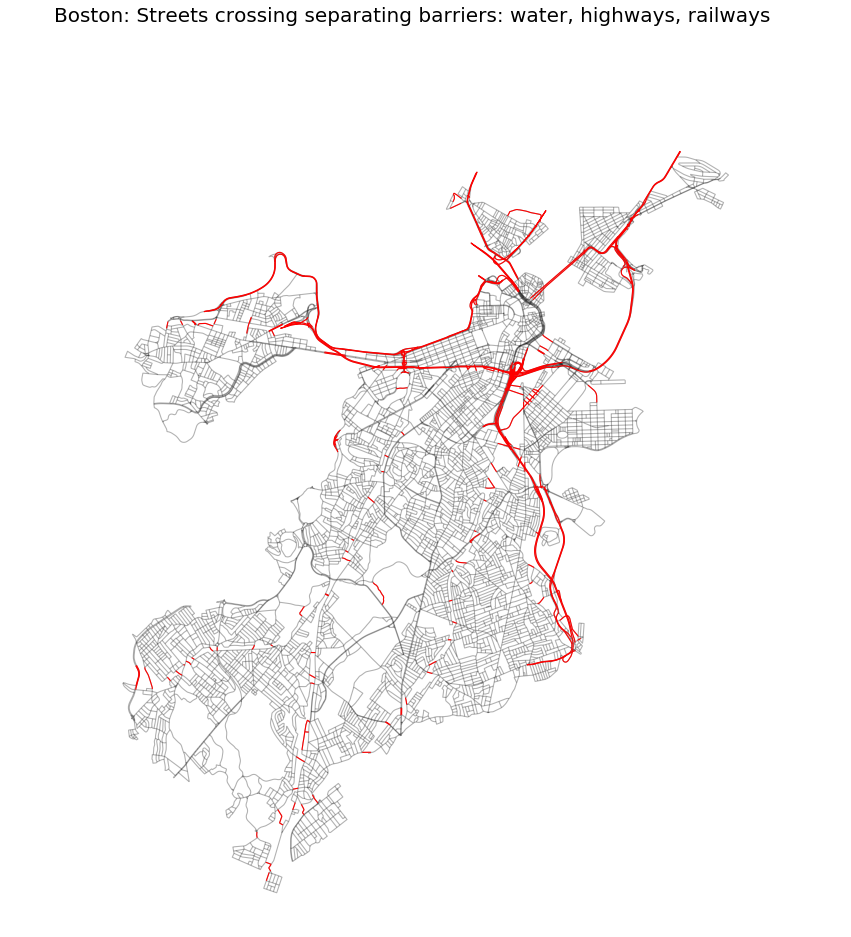

In [13]:
tmp = edges_graph[edges_graph.sep_barr == True].copy()
ci.plot_lines(tmp, black_background = False, fig_size = 15,  color = 'red', 
              title = city_name+': Streets crossing separating barriers: water, highways, railways',
              gdf_base_map = edges_graph, base_map_alpha = 0.3, legend = False)

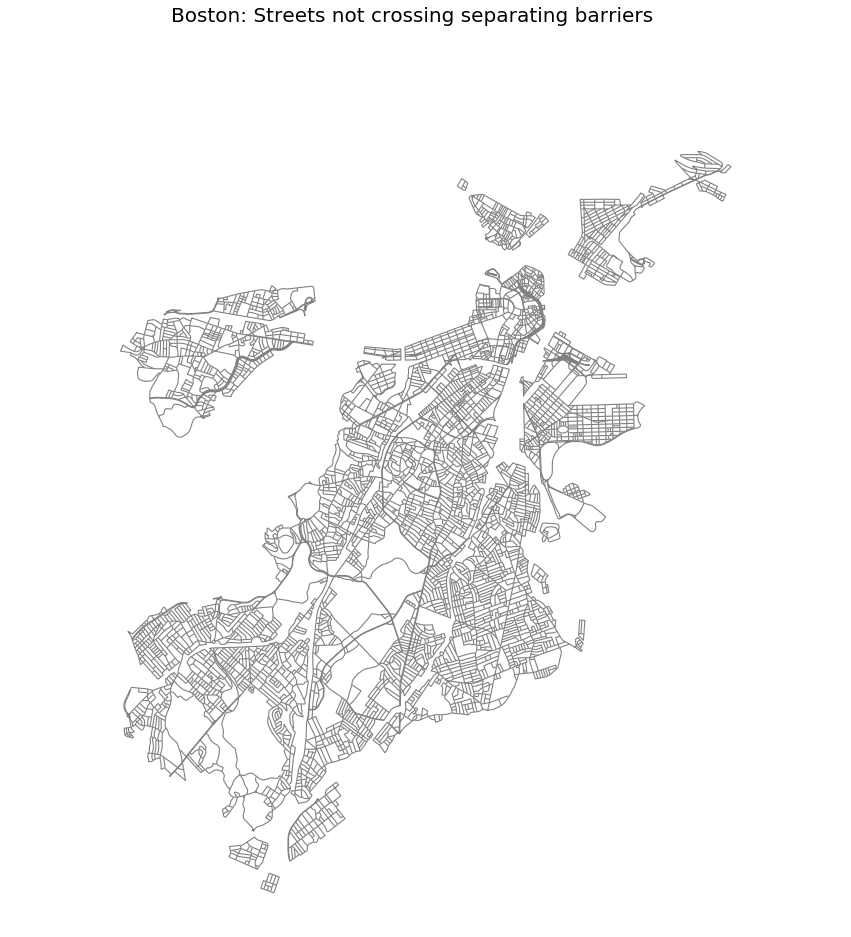

In [6]:
## removing streets segments which are crossing barriers
edges_graph_nb = edges_graph[edges_graph.sep_barr != True].copy()
nodes_graph_nb, edges_graph_nb = ci.clean_network(nodes_graph, edges_graph_nb, dead_ends = True, 
                        remove_disconnected_islands = False, self_loops = True, same_uv_edges = True)
ci.plot_lines(edges_graph_nb, black_background = False, fig_size = 15,  color = 'gray', 
              title = city_name+': Streets not crossing separating barriers', legend = False)

In [16]:
saving_path = 'Outputs/'+city_name

to_convert = ['c_barr']
edges_graph_string = edges_graph.copy()
for column in to_convert: 
    edges_graph_string[column] = edges_graph_string[column].astype(str)

edges_graph_string.to_file(input_path+"_edges.shp", driver='ESRI Shapefile')
nodes_graph_nb.to_file(input_path+"_nodes_nb.shp", driver='ESRI Shapefile')
edges_graph_nb.drop(['c_barr', 'sep_barr'], axis = 1).to_file(saving_path+"_edges_nb.shp", driver='ESRI Shapefile')

# 2. Creating dual graph for extracting regions

### Creating the dual geodataframes from scratch

In [17]:
nodesDual_graph, edgesDual_graph = ci.dual_gdf(nodes_graph, edges_graph.drop('c_barr', axis = 1), epsg)
nodesDual_graph_nb, edgesDual_graph_nb = ci.dual_gdf(nodes_graph_nb, edges_graph_nb.drop('c_barr', axis = 1), epsg)

# saving
nodesDual_graph.drop(['intersecting'], axis = 1, errors = 'ignore').to_file(input_path+"_nodesDual.shp", driver='ESRI Shapefile')
edgesDual_graph.to_file(input_path+"_edgesDual.shp", driver='ESRI Shapefile')

# saving no barriers
nodesDual_graph_nb.drop(['intersecting'], axis = 1, errors = 'ignore').to_file(input_path+"_nodesDual_nb.shp", driver='ESRI Shapefile')
edgesDual_graph_nb.to_file(input_path+"_edgesDual_nb.shp", driver='ESRI Shapefile')

### or load the from files

In [4]:
nodesDual_graph = gpd.read_file(input_path+"_nodesDual.shp", driver='ESRI Shapefile')
edgesDual_graph = gpd.read_file(input_path+"_edgesDual.shp", driver='ESRI Shapefile')
nodesDual_graph_nb = gpd.read_file(input_path+"_nodesDual_nb.shp", driver='ESRI Shapefile')
edgesDual_graph_nb = gpd.read_file(input_path+"_edgesDual_nb.shp", driver='ESRI Shapefile')

nodesDual_graph.index, nodesDual_graph_nb.index = nodesDual_graph.edgeID, nodesDual_graph_nb.edgeID
nodesDual_graph.index.name, nodesDual_graph_nb.index.name = None, None

In [6]:
# creating dual_graph and primal graphs
graph = ci.graph_fromGDF(nodes_graph, edges_graph)
dual_graph = ci.dual_graph_fromGDF(nodesDual_graph, edgesDual_graph)
graph_nb = ci.graph_fromGDF(nodes_graph_nb, edges_graph_nb)
dual_graph_nb = ci.dual_graph_fromGDF(nodesDual_graph_nb, edgesDual_graph_nb)

### 2.1 District identification - Single Membership

In [9]:
## creating graph usable in igraph
nodesDual_graphIG, edgesDual_graphIG = ur.reset_index_dual_gdfsIG(nodesDual_graph, edgesDual_graph)
dual_graphIG = ur.dual_graphIG_fromGDF(nodesDual_graphIG, edgesDual_graphIG)

## creating graph usable in igraph - barriers removal
nodesDual_graphIG_nb, edgesDual_graphIG_nb = ur.reset_index_dual_gdfsIG(nodesDual_graph_nb, edgesDual_graph_nb)
dual_graphIG_nb = ur.dual_graphIG_fromGDF(nodesDual_graphIG_nb, edgesDual_graphIG_nb)

### Extract the communities -- Dual Graph
#### Entire Street Network

In [158]:
# Clauset-Newman-Moore greedy modularity maximization
clauset = list(nxcomm.greedy_modularity_communities(dual_graphIG))
for community, n in enumerate(clauset):
    nodesDual_graphIG.loc[nodesDual_graphIG.index.isin(list(n)), 'ca'] = community 

# label_propagation
label_propagation = nxcomm.label_propagation_communities(dual_graphIG)
for community, n in enumerate(label_propagation):
    nodesDual_graphIG.loc[nodesDual_graphIG.index.isin(list(n)), 'lp'] = community 

# waltrap
walktrap = algorithms.walktrap(dual_graphIG)
for community, n in enumerate(walktrap.communities): 
    nodesDual_graphIG.loc[nodesDual_graphIG.index.isin(n), 'wa'] = community

# louvain
louvain = community.best_partition(dual_graphIG, weight='rad')
nodesDual_graphIG['lo'] = nodesDual_graphIG.index.map(louvain)

columns = ['ca', 'lp','wa', 'lo']
to_merge = ['edgeID']+columns
districts = pd.merge(edges_graph, nodesDual_graphIG[to_merge], left_on = "edgeID", right_on = "edgeID", how= "left")

for i in columns:
    districts[i] = districts[i].astype(int) 

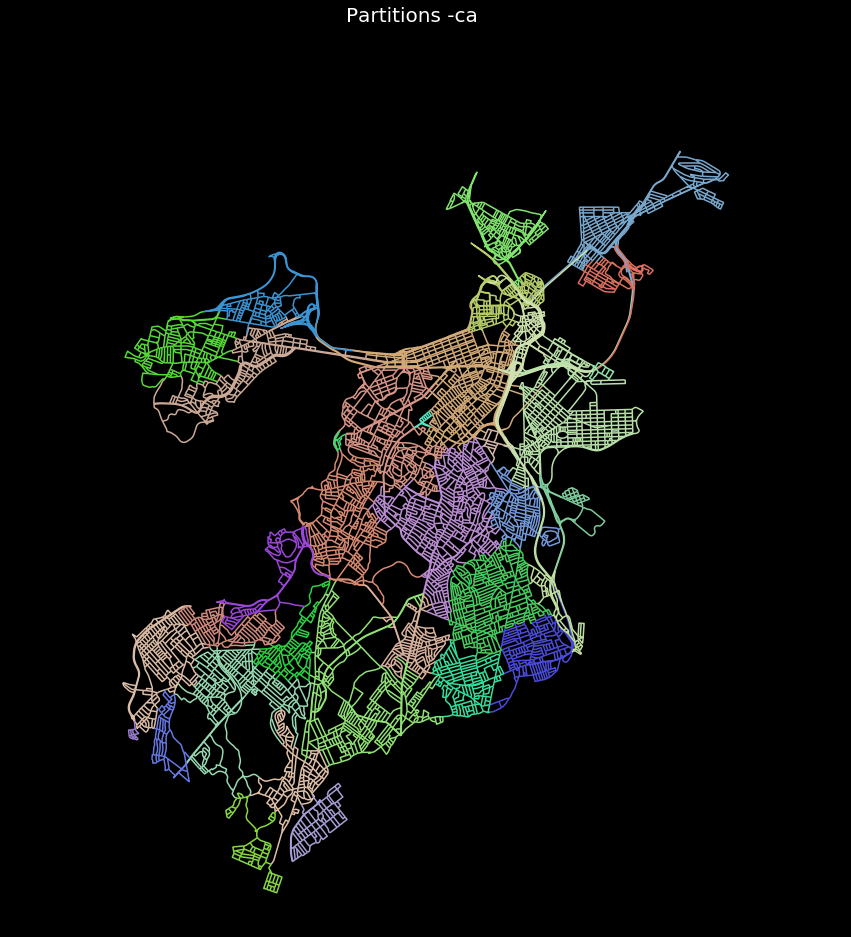

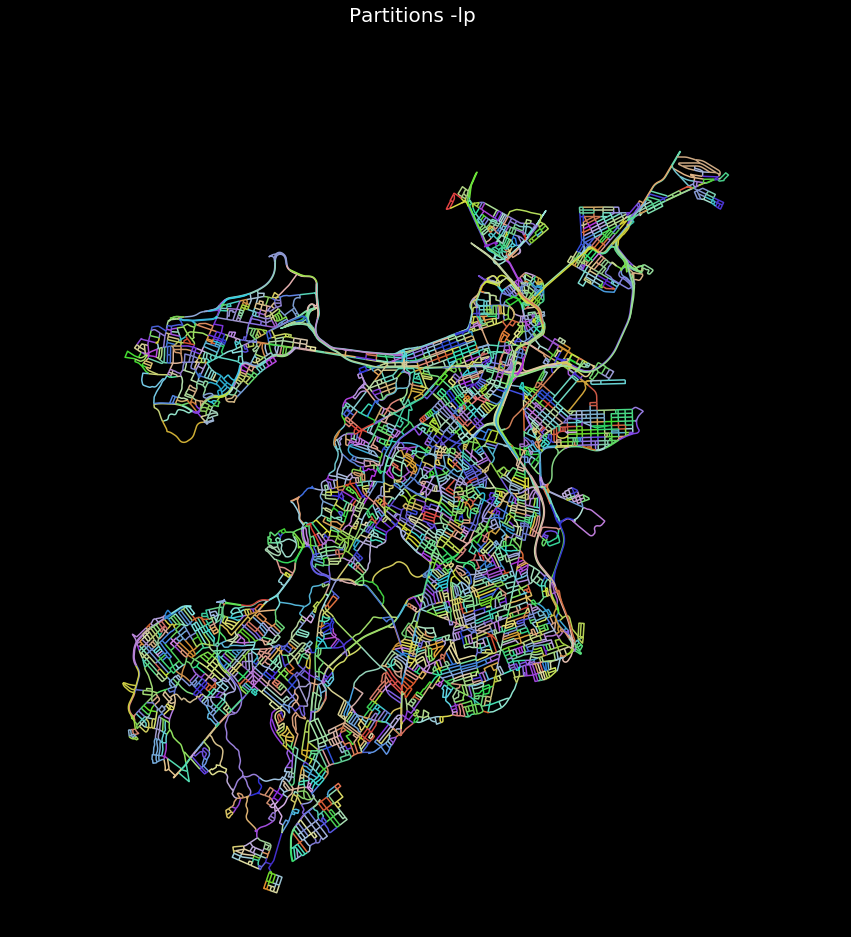

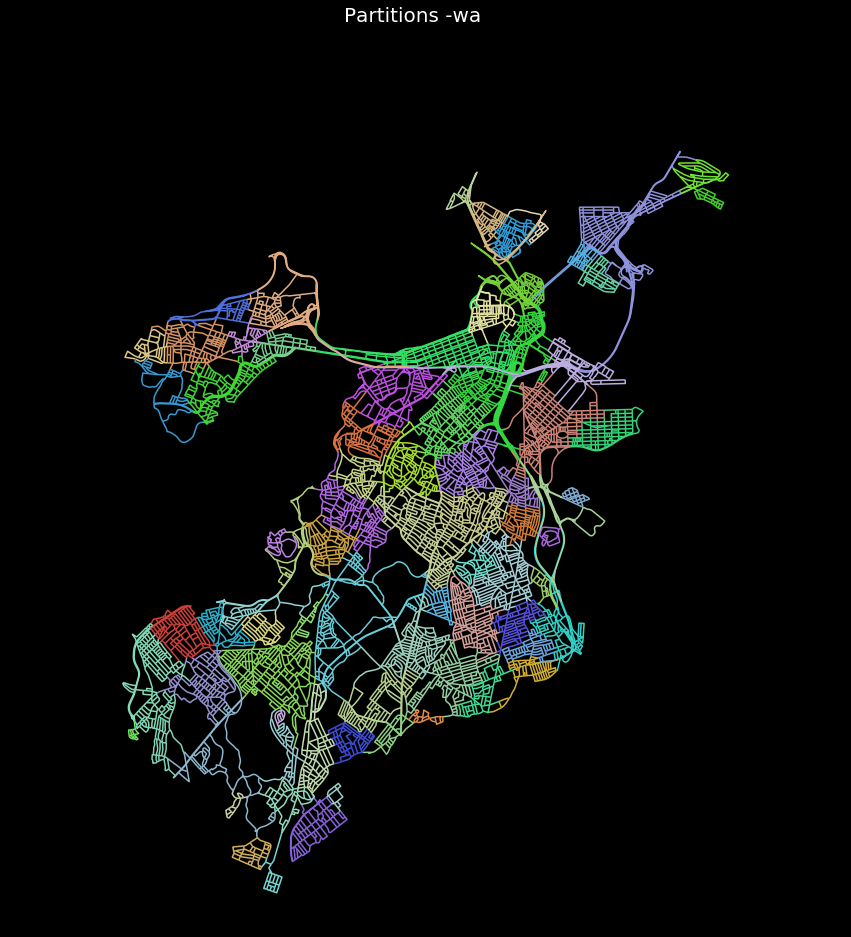

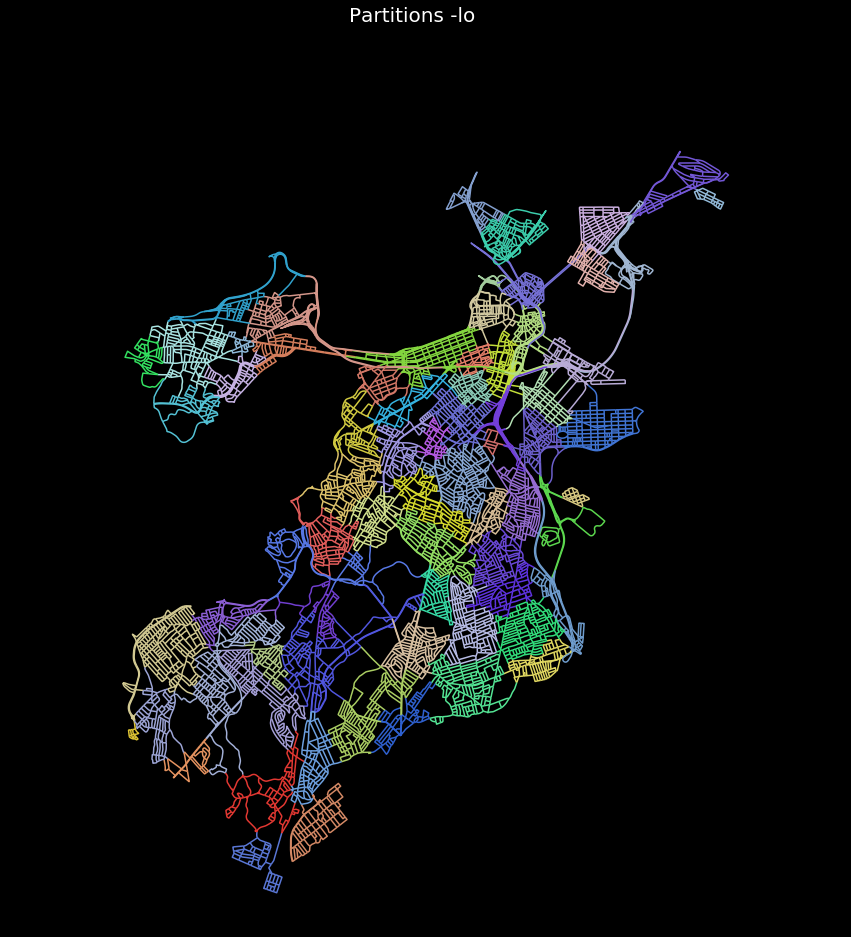

In [83]:
for column in columns:
    cmap = ci.rand_cmap(nlabels = len(districts[column].unique()), type_color='bright')
    ci.plot_lines(districts, column = column, title = 'Partitions -'+column, lw = 1.5, cmap = cmap, 
                  black_background = True, legend = False, fig_size = 15)

#### Barrier removal

In [159]:
# Clauset-Newman-Moore greedy modularity maximization
clauset_nb = list(nxcomm.greedy_modularity_communities(dual_graphIG_nb))
for community, n in enumerate(clauset_nb):
    nodesDual_graphIG_nb.loc[nodesDual_graphIG_nb.index.isin(list(n)), 'ca_nb'] = community 

# label_propagation
label_propagation_nb = nxcomm.label_propagation_communities(dual_graphIG_nb)
for community, n in enumerate(label_propagation_nb):
    nodesDual_graphIG_nb.loc[nodesDual_graphIG_nb.index.isin(list(n)), 'lp_nb'] = community 

# waltrap
walktrap_nb = algorithms.walktrap(dual_graphIG_nb)
for community, n in enumerate(walktrap_nb.communities): 
    nodesDual_graphIG_nb.loc[nodesDual_graphIG_nb.index.isin(n), 'wa_nb'] = community

# louvain
louvain_nb = community.best_partition(dual_graphIG_nb, weight='rad')
nodesDual_graphIG_nb['lo_nb'] = nodesDual_graphIG_nb.index.map(louvain_nb)

columns_nb = ['ca_nb', 'lp_nb','wa_nb', 'lo_nb']
to_merge = ['edgeID']+columns_nb
districts = pd.merge(districts, nodesDual_graphIG_nb[to_merge], left_on = "edgeID", right_on = "edgeID", how= "left")
districts[columns_nb] = districts[columns_nb].where(~districts[columns_nb].isnull(), 999999)
for i in columns_nb:
    districts[i] = districts[i].astype(int) 

In [160]:
# saving
saving_path = 'Outputs/'+city_name
districts.drop('c_barr', axis =1).to_file(saving_path+"_districts.shp", driver='ESRI Shapefile')

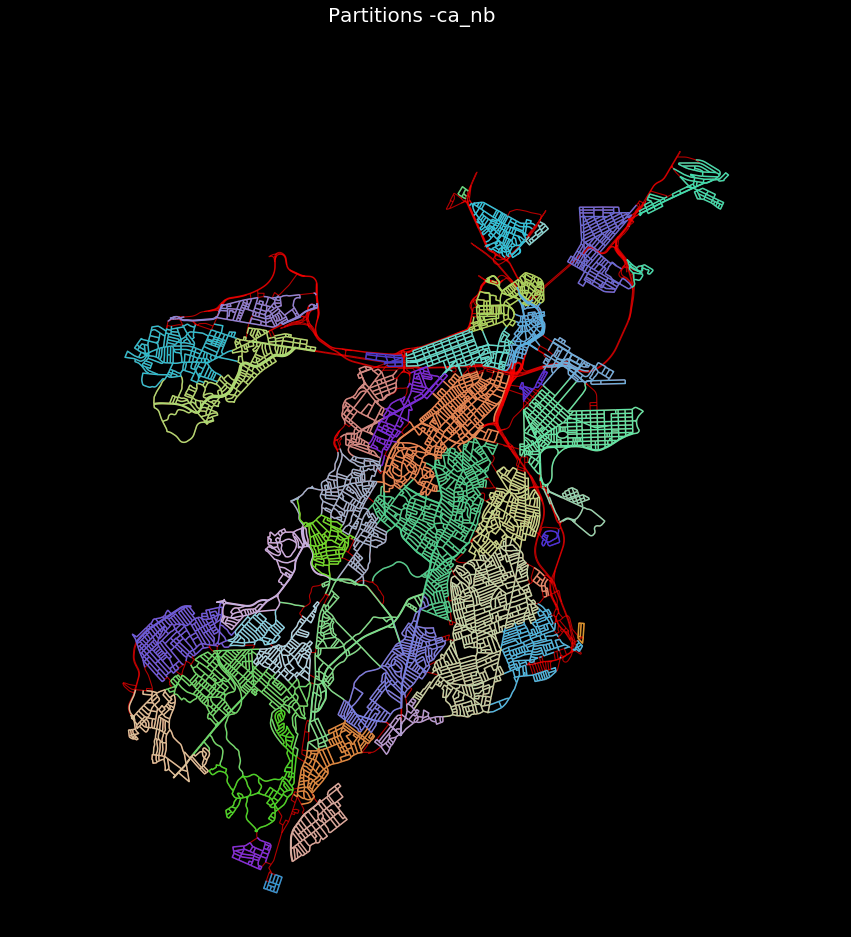

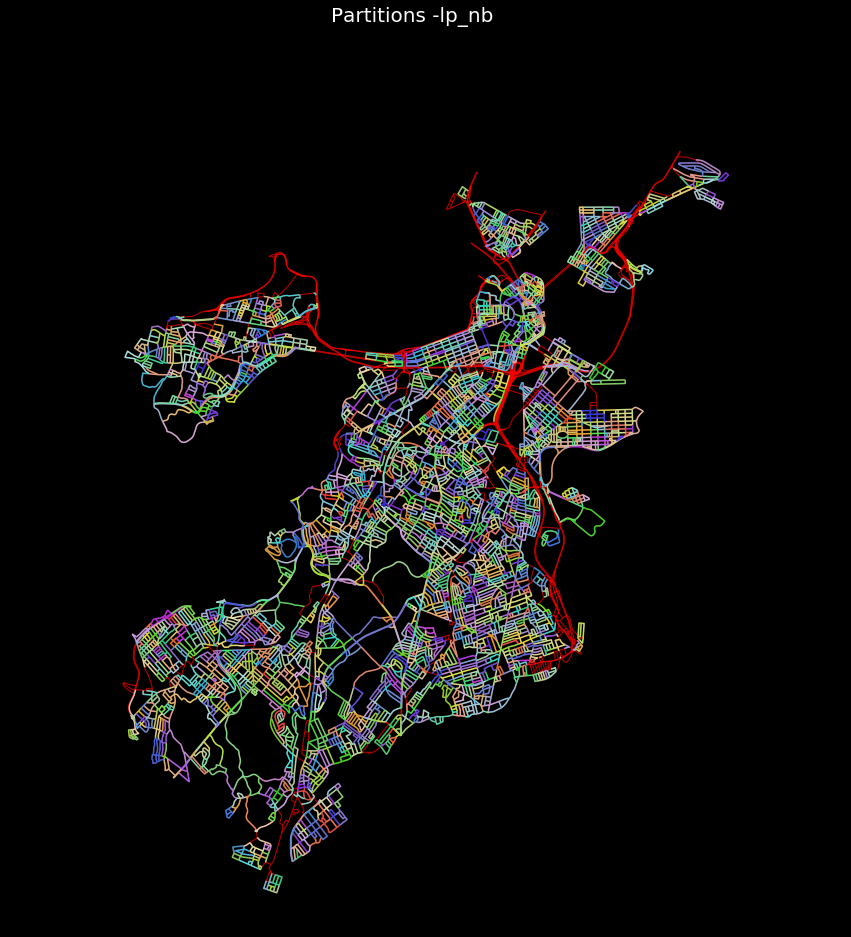

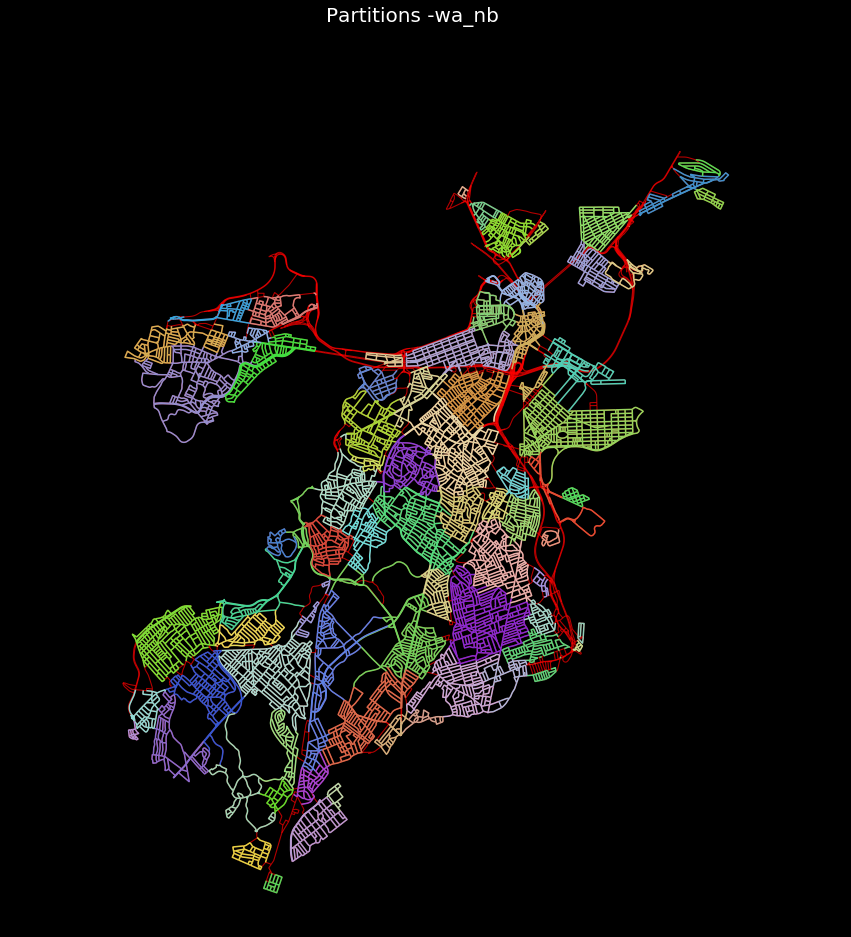

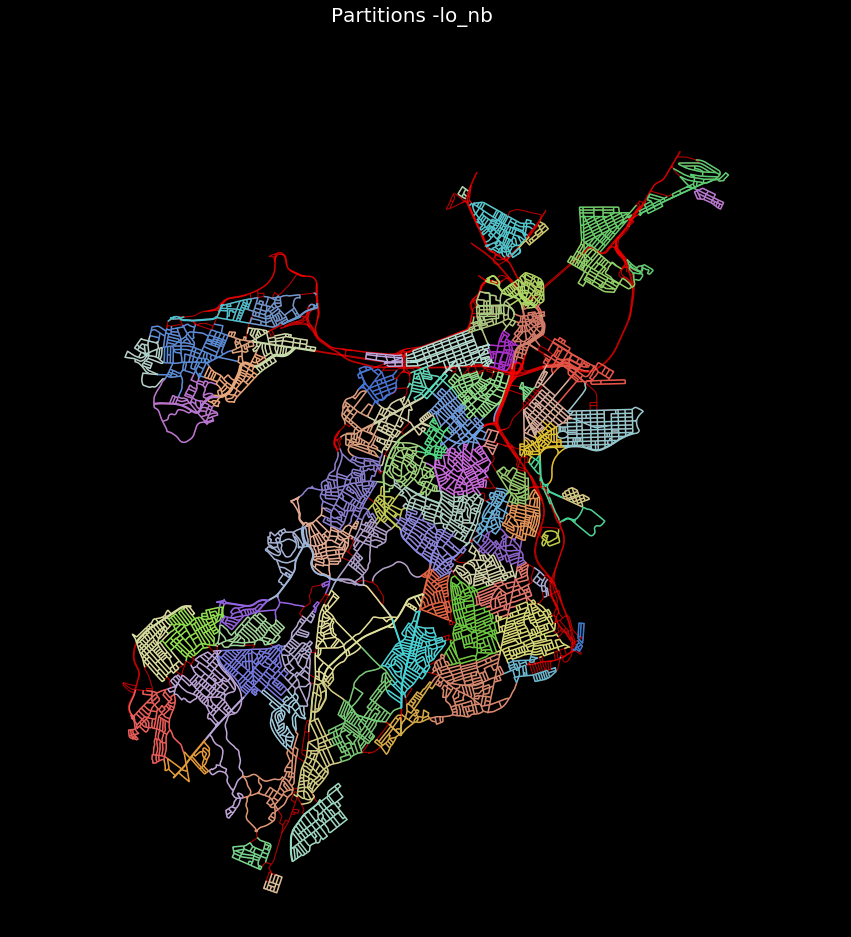

In [89]:
for column in columns_nb:
    cmap = ci.rand_cmap(nlabels = len(districts[column].unique()), type_color='bright')
    
    base_map = {'gdf_base_map' : edges_graph, 'base_map_alpha' : 0.7, 'base_map_color' : 'red'}
    ci.plot_lines(districts[districts[column] != 999999], column = column, title = 'Partitions -'+column, lw = 1.5, cmap = cmap, 
                  black_background = True, legend = False, fig_size = 15, **base_map)

### Extract the communities -- Primal Graph
#### Entire Street Network

In [ ]:
# loading primal graph with barrier removal, if necessary
nodes_graph_nb = gpd.read_file(input_path+"_nodes_nb.shp", driver='ESRI Shapefile')
edges_graph_nb = gpd.read_file(input_path+"_edges_nb.shp", driver='ESRI Shapefile')
nodes_graph_nb.index, edges_graph_nb.index = nodes_graph_nb.nodeID, edges_graph_nb.edgeID
nodes_graph_nb.index.name, edges_graph_nb.index.name = None, None

In [20]:
## creating graph usable in igraph
nodes_graphIG, edges_graphIG = ur.reset_index_gdfs_forIG(nodes_graph, edges_graph, 'nodeID')
graphIG = ci.graph_fromGDF(nodes_graphIG, edges_graphIG)

## creating graph usable in igraph - barriers removal
nodes_graphIG_nb, edges_graphIG_nb = ur.reset_index_gdfs_forIG(nodes_graph_nb, edges_graph_nb, 'nodeID')
graphIG_nb = ci.graph_fromGDF(nodes_graphIG_nb, edges_graphIG_nb)

In [167]:
# Clauset-Newman-Moore greedy modularity maximization
clauset = list(nxcomm.greedy_modularity_communities(graphIG))
for community, n in enumerate(clauset):
    nodes_graphIG.loc[nodes_graphIG.index.isin(list(n)), 'ca'] = community 

# label_propagation
label_propagation = nxcomm.label_propagation_communities(graphIG)
for community, n in enumerate(label_propagation):
    nodes_graphIG.loc[nodes_graphIG.index.isin(list(n)), 'lp'] = community 

# waltrap
walktrap = algorithms.walktrap(graphIG)
for community, n in enumerate(walktrap.communities): 
    nodes_graphIG.loc[nodes_graphIG.index.isin(n), 'wa'] = community

# louvain
louvain = community.best_partition(graphIG, weight='length')
nodes_graphIG['lo'] = nodes_graphIG.index.map(louvain)

columns = ['ca', 'lp','wa', 'lo']
to_merge = ['old_nodeID']+columns
nodes_districts = pd.merge(nodes_graph, nodes_graphIG[to_merge], left_on = "nodeID", right_on = "old_nodeID", how= "left")
nodes_districts.drop('old_nodeID', axis = 1, inplace = True)
for i in columns:
     nodes_districts[i] = nodes_districts[i].astype(int)

#### Barrier removal

In [168]:
# Clauset-Newman-Moore greedy modularity maximization
clauset = list(nxcomm.greedy_modularity_communities(graphIG_nb))
for community, n in enumerate(clauset):
    nodes_graphIG_nb.loc[nodes_graphIG_nb.index.isin(list(n)), 'ca_nb'] = community 

# label_propagation
label_propagation = nxcomm.label_propagation_communities(graphIG_nb)
for community, n in enumerate(label_propagation):
    nodes_graphIG_nb.loc[nodes_graphIG_nb.index.isin(list(n)), 'lp_nb'] = community 

# waltrap
walktrap = algorithms.walktrap(graphIG_nb)
for community, n in enumerate(walktrap.communities): 
    nodes_graphIG_nb.loc[nodes_graphIG_nb.index.isin(n), 'wa_nb'] = community

# louvain
louvain = community.best_partition(graphIG_nb, weight='length')
nodes_graphIG_nb['lo_nb'] = nodes_graphIG_nb.index.map(louvain)

columns_nb = ['ca_nb', 'lp_nb','wa_nb', 'lo_nb']
to_merge = ['old_nodeID']+columns_nb

nodes_districts = pd.merge(nodes_districts, nodes_graphIG_nb[to_merge], left_on = "nodeID", right_on = "old_nodeID", how= "left")
nodes_districts.drop('old_nodeID', axis = 1, inplace = True)
nodes_districts[columns_nb] = nodes_districts[columns_nb].where(~nodes_districts[columns_nb].isnull(), 999999)
for i in columns_nb:
     nodes_districts[i] = nodes_districts[i].astype(int)
        
nodes_districts.index = nodes_districts['nodeID']
nodes_districts.index.name = None

In [169]:
to_assign = columns+columns_nb
districts_primal = edges_graph.copy()

for i in to_assign:
    districts_primal = assign_districts_to_edges_from_nodes(districts_primal, nodes_districts, district_field = i)

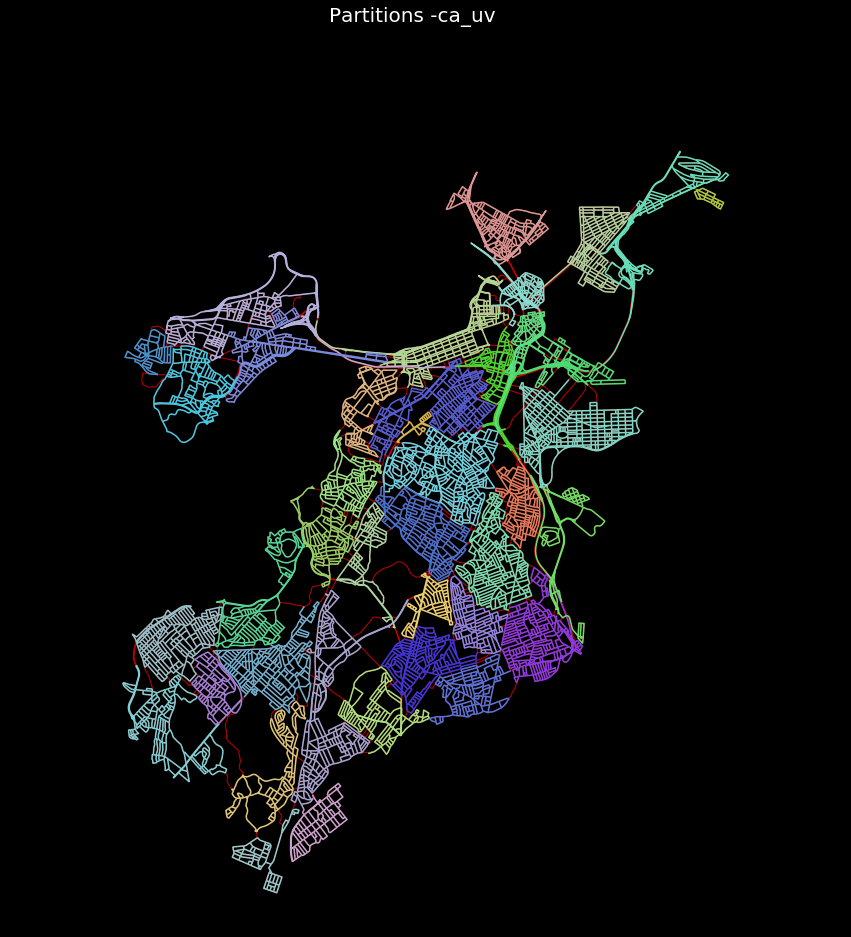

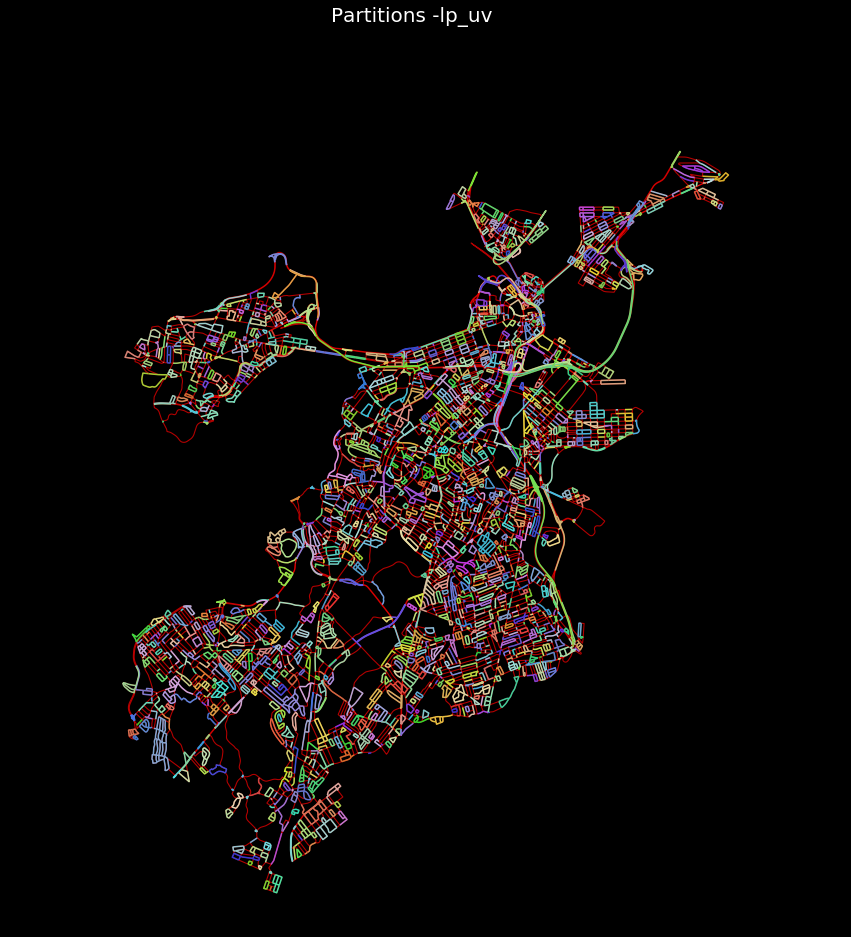

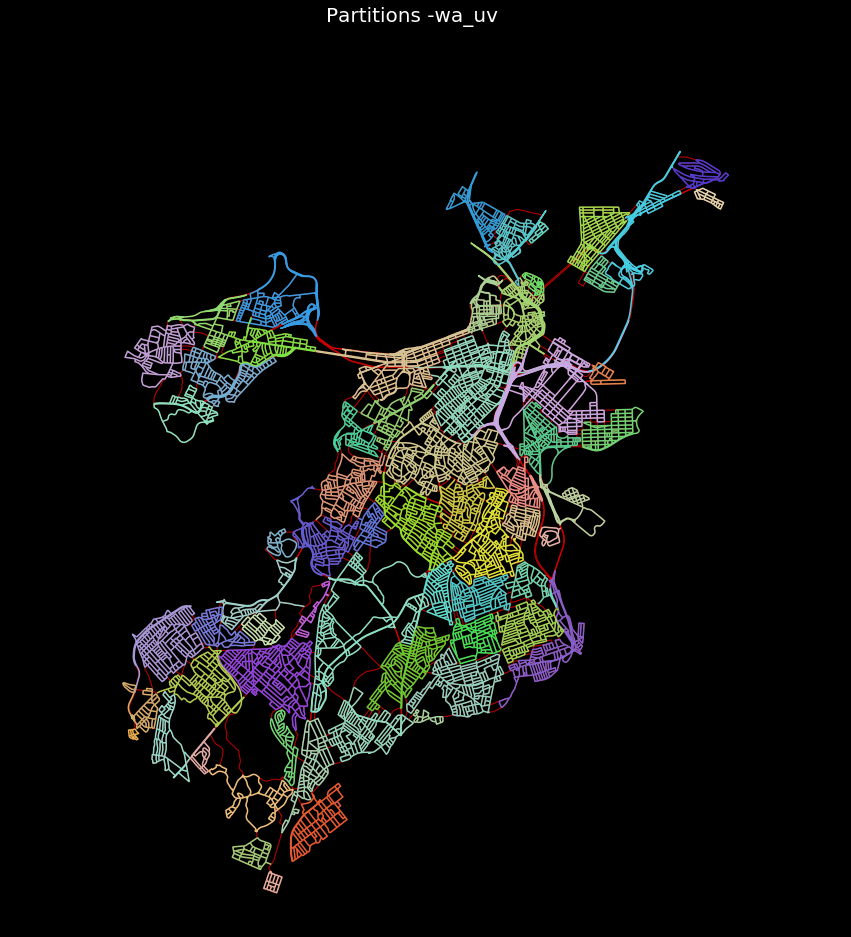

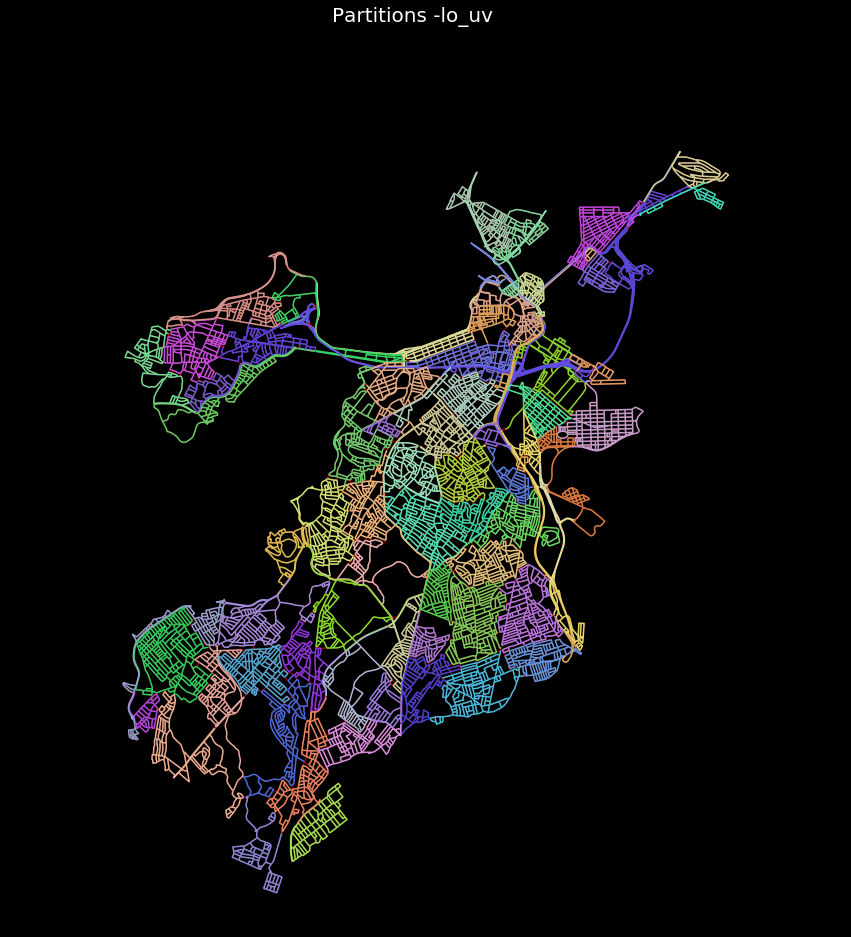

In [154]:
to_show = ['ca_uv', 'lp_uv', 'wa_uv','lo_uv']

for column in to_show:
    cmap = ci.rand_cmap(nlabels = len(districts_primal[column].unique()), type_color='bright')
    
    base_map = {'gdf_base_map' : edges_graph, 'base_map_alpha' : 0.7, 'base_map_color' : 'red'}
    ci.plot_lines(districts_primal[districts_primal[column] != 999999], column = column, title = 'Partitions -'+column, lw = 1.5, cmap = cmap, 
                  black_background = True, legend = False, fig_size = 15, **base_map)

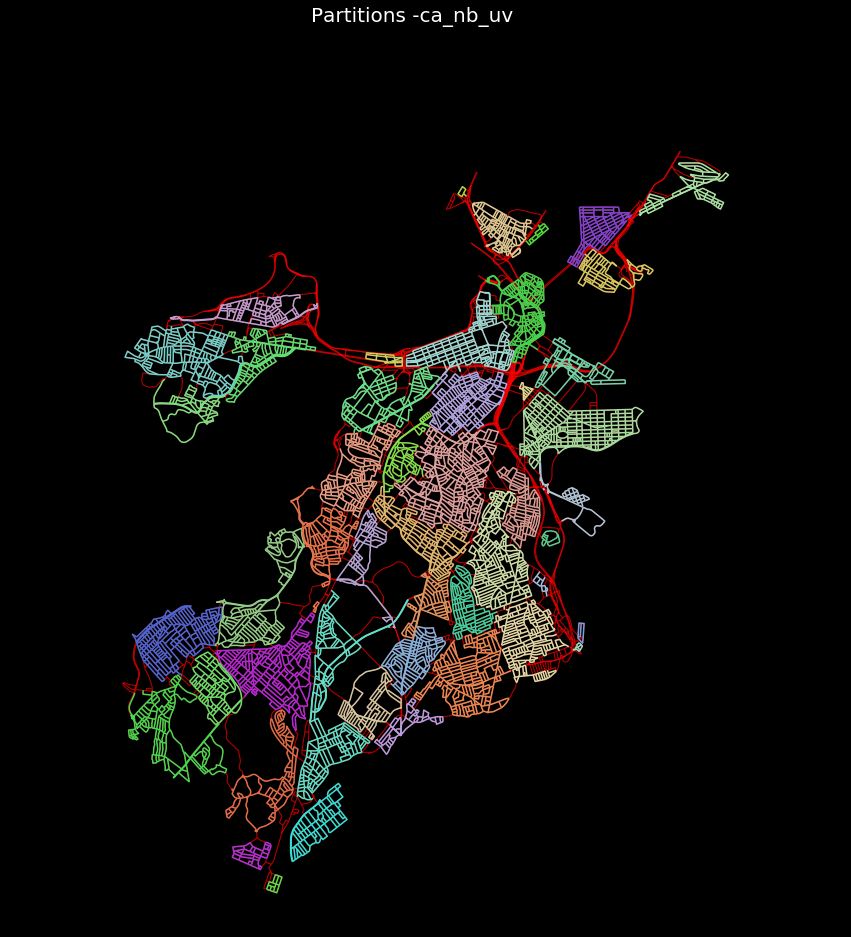

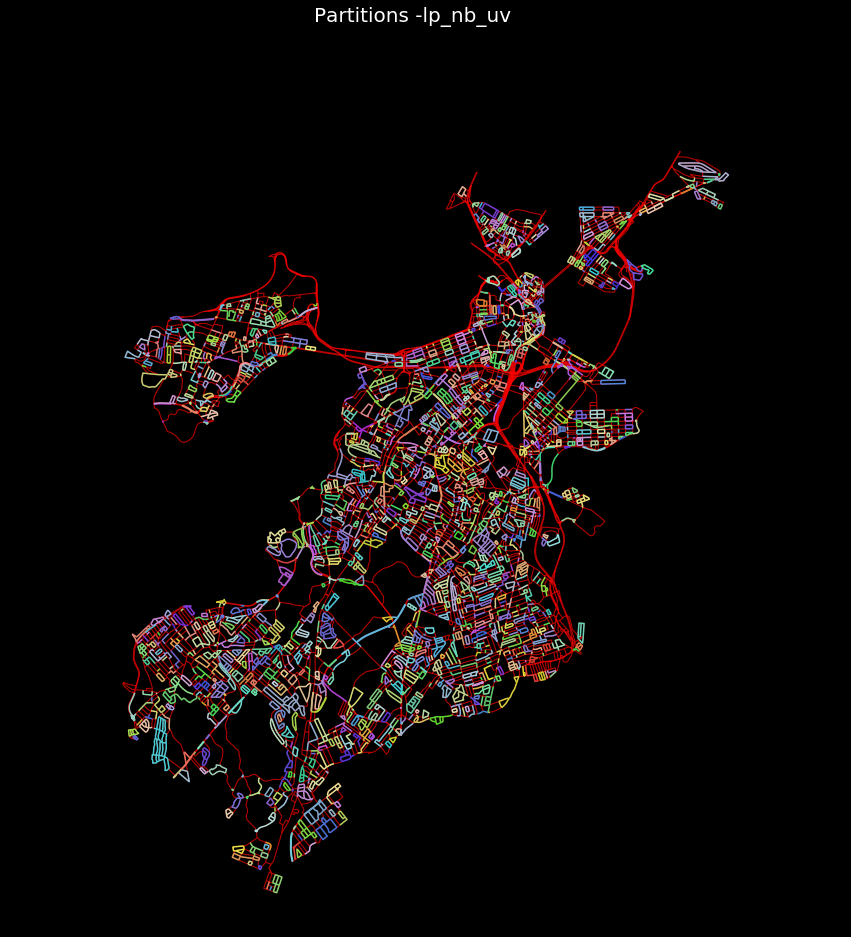

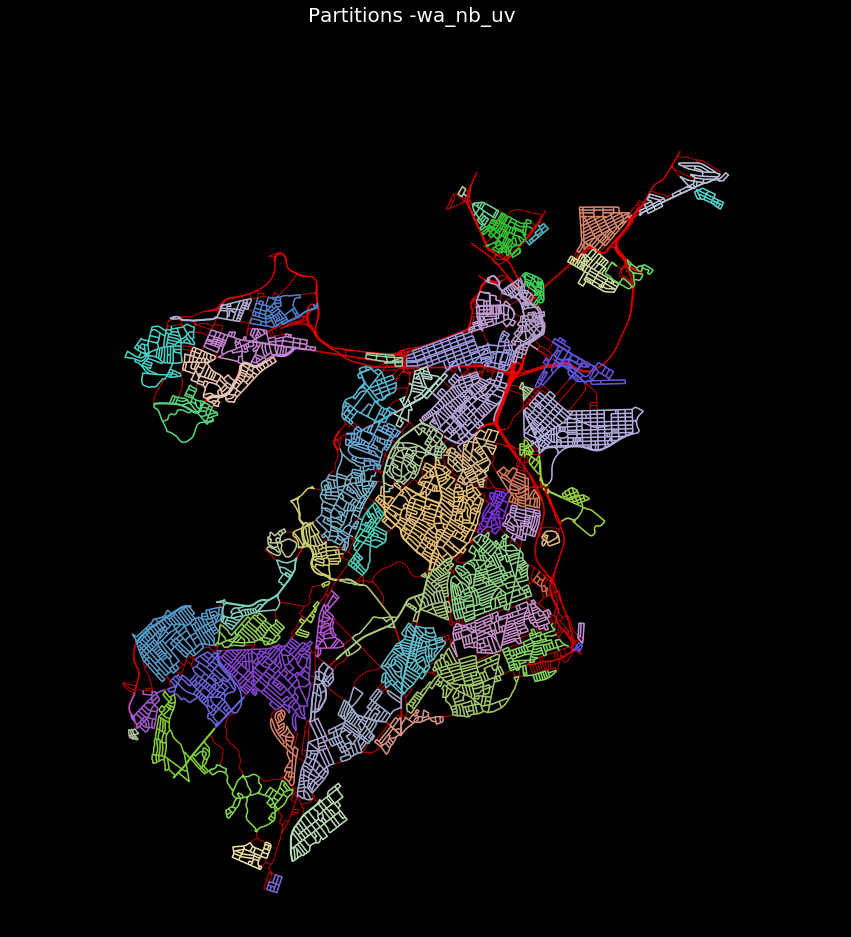

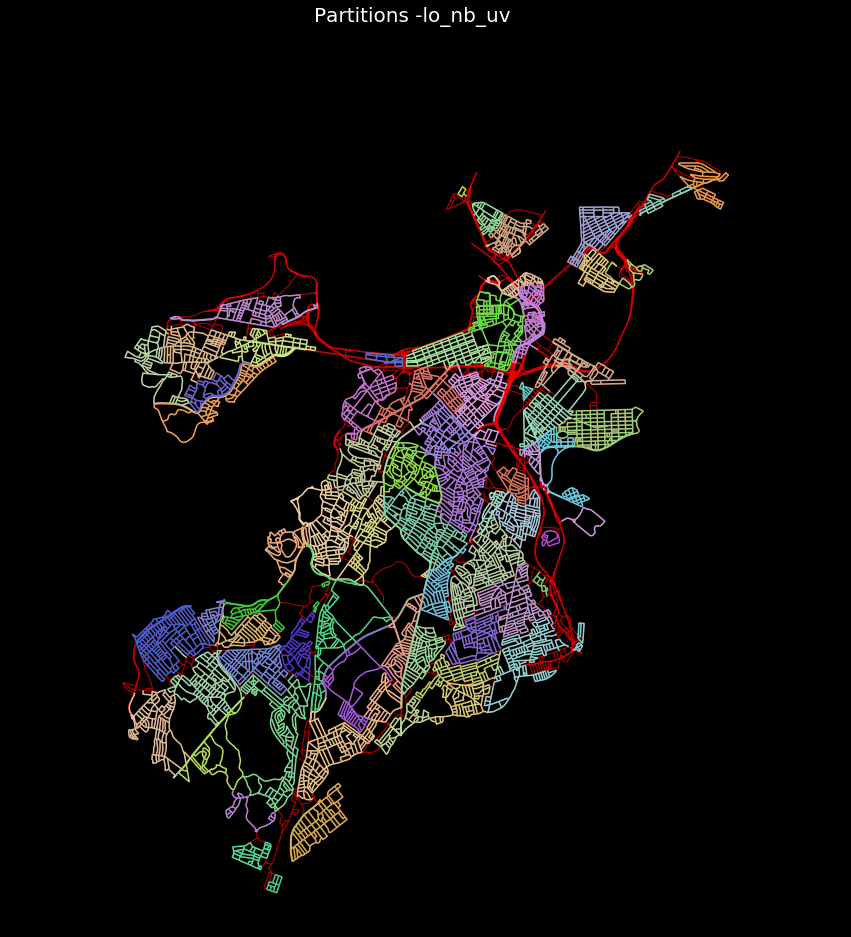

In [170]:
to_show = ['ca_nb_uv', 'lp_nb_uv', 'wa_nb_uv','lo_nb_uv']

for column in to_show:
    cmap = ci.rand_cmap(nlabels = len(districts_primal[column].unique()), type_color='bright')
    
    base_map = {'gdf_base_map' : edges_graph, 'base_map_alpha' : 0.7, 'base_map_color' : 'red'}
    ci.plot_lines(districts_primal[districts_primal[column] != 999999], column = column, title = 'Partitions -'+column, lw = 1.5, cmap = cmap, 
                  black_background = True, legend = False, fig_size = 15, **base_map)

In [171]:
# saving
districts_primal.drop('c_barr', axis =1).to_file(saving_path+city_name+"_districts_primal.shp", driver='ESRI Shapefile')

### Comparison different methods vs louvain

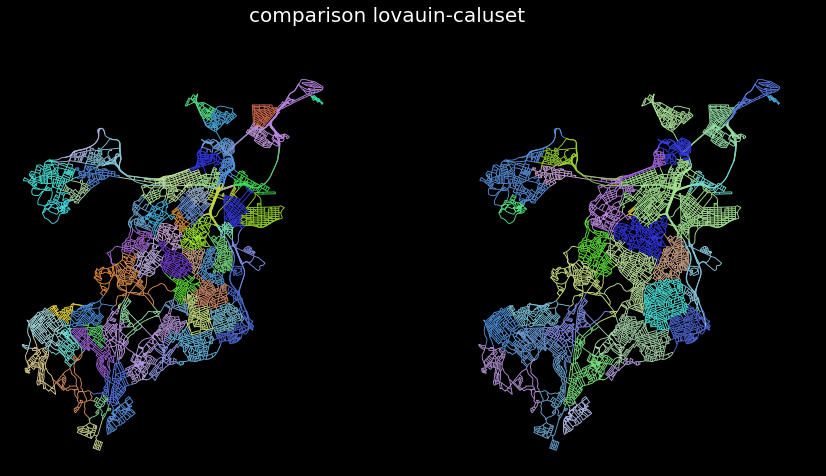

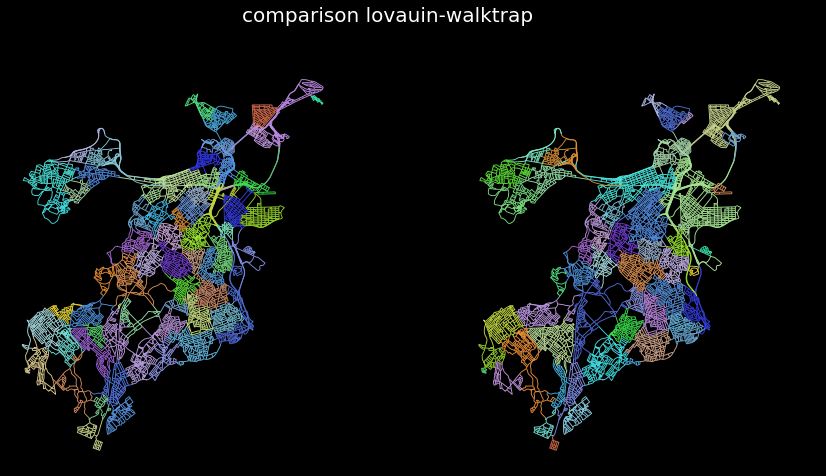

In [29]:
to_compare = ['caluset', 'walktrap']
for column in to_compare:
    ci.cmap = ci.rand_cmap(nlabels = 400, type_color='bright')
    
    base_map = {'gdf_base_map' : edges_graph, 'base_map_alpha' : 0.7, 'base_map_color' : 'red'}
    ci.plot_lines_aside(districts_fn, gdf_c = districts_fn, lw = 0.9, columnA = 'louvain' , columnB = column, 
                    title = 'comparison lovauin-'+column, scheme = None, cmap = cmap, black_background = True, 
                     fig_size = 15)

### Partitions as polygons

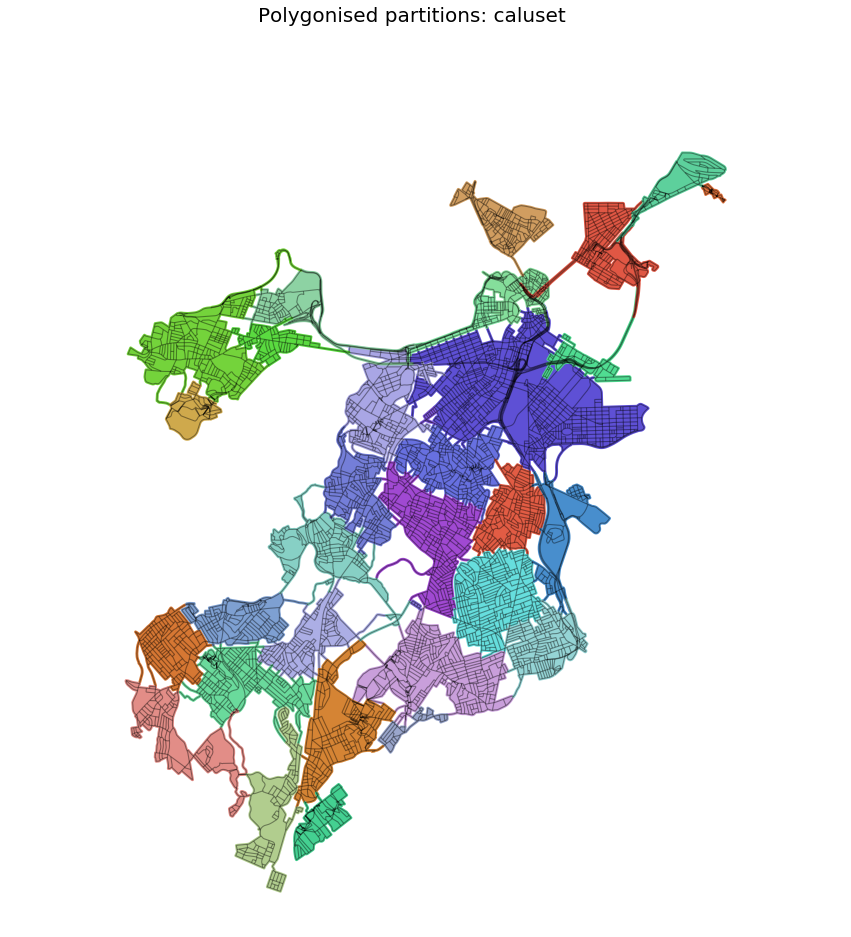

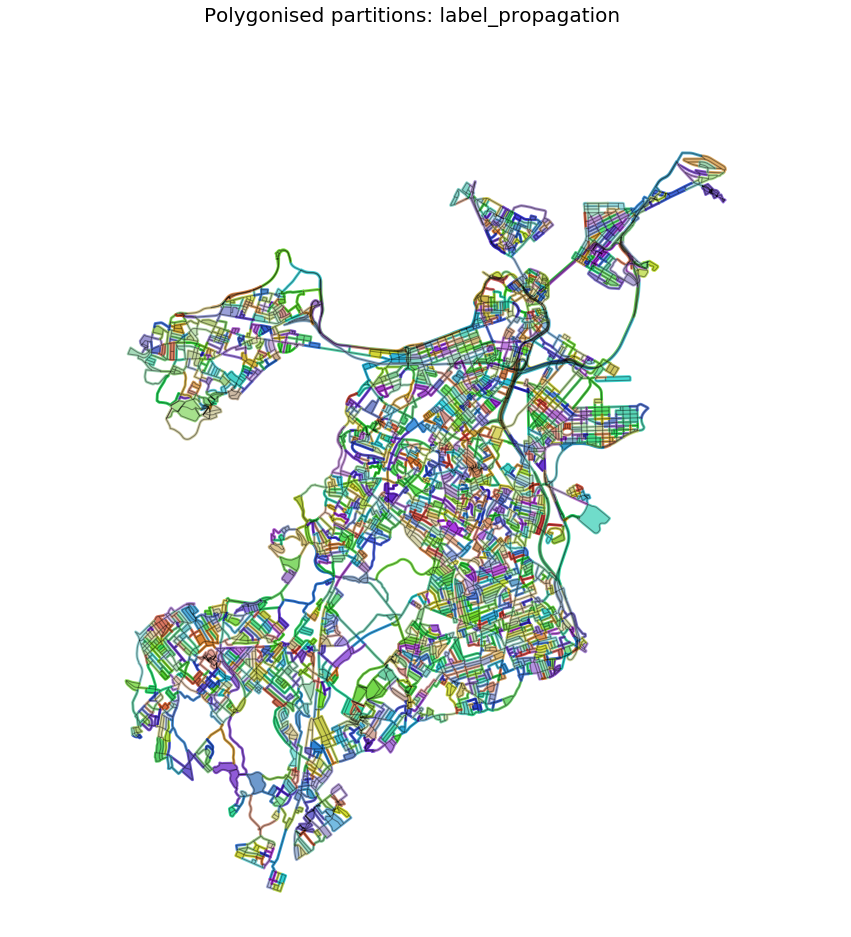

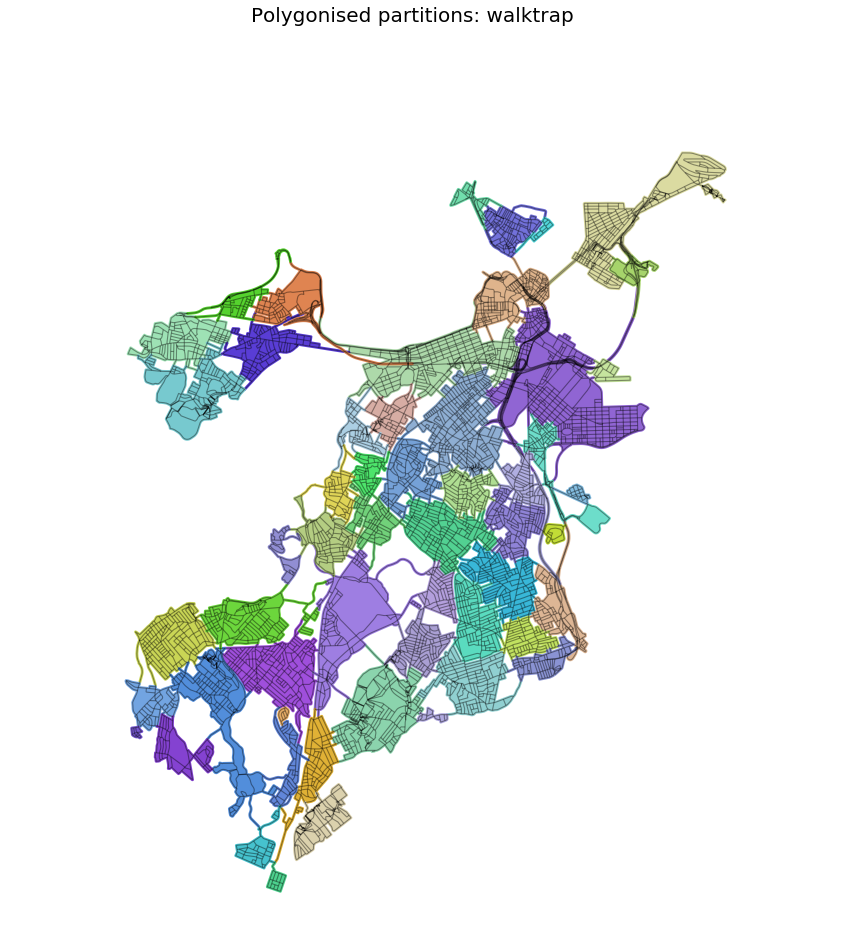

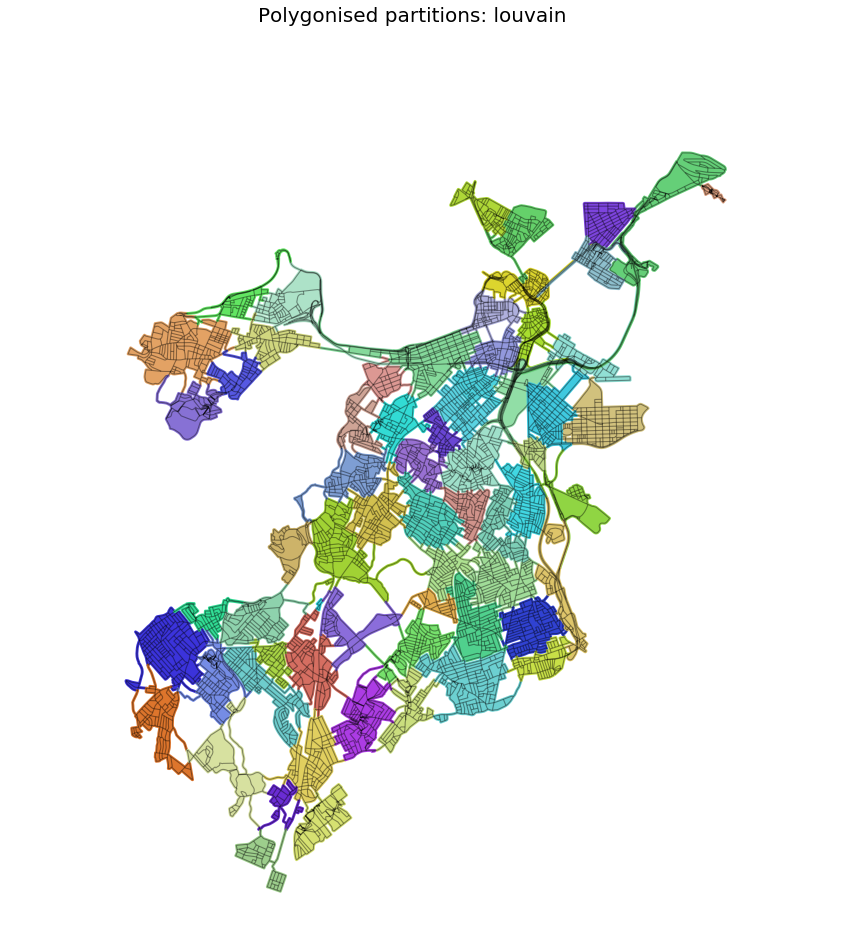

In [30]:
for column in columns:
    cmap = ci.rand_cmap(nlabels = len(districts_fn[column].unique()), type_color='bright')
    partitions = ci.polygonise_partition(districts_fn, column, crs)
    ci.plot_polygons(partitions, column = 'partitionID', cmap = cmap, title =  "Polygonised partitions: "+ column, 
                     black_background = False,  fig_size = 15, gdf_base_map = edges_graph)